In [1]:
# Copyright 2025 Bytedance Ltd. and/or its affiliates.
# SPDX-License-Identifier: Apache-2.0

%load_ext autoreload
%autoreload 2

import os
# os.environ["CUDA_VISIBLE_DEVICES"] = "4,5,6"
from copy import deepcopy
from typing import (
    Any,
    AsyncIterable,
    Callable,
    Dict,
    Generator,
    List,
    NamedTuple,
    Optional,
    Tuple,
    Union,
)
import requests
from io import BytesIO

from PIL import Image
import torch
from accelerate import infer_auto_device_map, load_checkpoint_and_dispatch, init_empty_weights

from data.transforms import ImageTransform
from data.data_utils import pil_img2rgb, add_special_tokens
from modeling.bagel import (
    BagelConfig, Bagel, Qwen2Config, Qwen2ForCausalLM, SiglipVisionConfig, SiglipVisionModel
)
from modeling.qwen2 import Qwen2Tokenizer
from modeling.bagel.qwen2_navit import NaiveCache
from modeling.autoencoder import load_ae
from safetensors.torch import load_file

from huggingface_hub import snapshot_download

save_dir = "/checkpoint/dream_v2/transfusion/BAGEL-7B-MoT"
# repo_id = "ByteDance-Seed/BAGEL-7B-MoT"
# cache_dir = save_dir + "/cache"

# snapshot_download(cache_dir=cache_dir,
#   local_dir=save_dir,
#   repo_id=repo_id,
#   local_dir_use_symlinks=False,
#   resume_download=True,
#   allow_patterns=["*.json", "*.safetensors", "*.bin", "*.py", "*.md", "*.txt"],
# )
model_path = save_dir  # Download from https://huggingface.co/ByteDance-Seed/BAGEL-7B-MoT

# LLM config preparing
llm_config = Qwen2Config.from_json_file(os.path.join(model_path, "llm_config.json"))
llm_config.qk_norm = True
llm_config.tie_word_embeddings = False
llm_config.layer_module = "Qwen2MoTDecoderLayer"

# ViT config preparing
vit_config = SiglipVisionConfig.from_json_file(os.path.join(model_path, "vit_config.json"))
vit_config.rope = False
vit_config.num_hidden_layers = vit_config.num_hidden_layers - 1

# VAE loading
vae_model, vae_config = load_ae(local_path=os.path.join(model_path, "ae.safetensors"))

# Bagel config preparing
config = BagelConfig(
    visual_gen=True,
    visual_und=True,
    llm_config=llm_config, 
    vit_config=vit_config,
    vae_config=vae_config,
    vit_max_num_patch_per_side=70,
    connector_act='gelu_pytorch_tanh',
    latent_patch_size=2,
    max_latent_size=64,
)

with init_empty_weights():
    language_model = Qwen2ForCausalLM(llm_config)
    vit_model      = SiglipVisionModel(vit_config)
    model          = Bagel(language_model, vit_model, config)
    model.vit_model.vision_model.embeddings.convert_conv2d_to_linear(vit_config, meta=True)

# Tokenizer Preparing
tokenizer = Qwen2Tokenizer.from_pretrained(model_path)
tokenizer, new_token_ids, _ = add_special_tokens(tokenizer)

# Image Transform Preparing
vae_transform = ImageTransform(1024, 512, 16)
vit_transform = ImageTransform(980, 224, 14)

In [2]:
max_mem_per_gpu = "80GiB"  # Modify it according to your GPU setting. On an A100, 80 GiB is sufficient to load on a single GPU.

device_map = infer_auto_device_map(
    model,
    max_memory={i: max_mem_per_gpu for i in range(torch.cuda.device_count())},
    no_split_module_classes=["Bagel", "Qwen2MoTDecoderLayer"],
)
print(device_map)

same_device_modules = [
    'language_model.model.embed_tokens',
    'time_embedder',
    'latent_pos_embed',
    'vae2llm',
    'llm2vae',
    'connector',
    'vit_pos_embed'
]

if torch.cuda.device_count() == 1:
    first_device = device_map.get(same_device_modules[0], "cuda:0")
    for k in same_device_modules:
        if k in device_map:
            device_map[k] = first_device
        else:
            device_map[k] = "cuda:0"
else:
    first_device = device_map.get(same_device_modules[0])
    for k in same_device_modules:
        if k in device_map:
            device_map[k] = first_device

# Thanks @onion-liu: https://github.com/ByteDance-Seed/Bagel/pull/8
model = load_checkpoint_and_dispatch(
    model,
    checkpoint=os.path.join(model_path, "ema.safetensors"),
    device_map=device_map,
    offload_buffers=True,
    dtype=torch.bfloat16,
    force_hooks=True,
    offload_folder="/tmp/offload"
)

model = model.eval()
print('Model loaded')

The safetensors archive passed at /checkpoint/dream_v2/transfusion/BAGEL-7B-MoT/ema.safetensors does not contain metadata. Make sure to save your model with the `save_pretrained` method. Defaulting to 'pt' metadata.


OrderedDict([('', 0)])
Model loaded


In [3]:
from inferencer import InterleaveInferencer
import random
import numpy as np

inferencer = InterleaveInferencer(
    model=model, 
    vae_model=vae_model, 
    tokenizer=tokenizer, 
    vae_transform=vae_transform, 
    vit_transform=vit_transform, 
    new_token_ids=new_token_ids
)

seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [4]:
# Image gen with think params 
t2i_think_params =dict(
    think=True,
    max_think_token_n=1000,
    do_sample=False,
    # text_temperature=0.3,
    cfg_text_scale=4.0,
    cfg_img_scale=1.0,
    cfg_interval=[0.4, 1.0],
    timestep_shift=3.0,
    num_timesteps=50,
    cfg_renorm_min=0.0,
    cfg_renorm_type="global",
)

# Edit with think params
edit_think_params = dict(
    think=True,
    max_think_token_n=1000,
    do_sample=False,
    # text_temperature=0.3,
    cfg_text_scale=4.0,
    cfg_img_scale=2.0,
    cfg_interval=[0.0, 1.0],
    timestep_shift=3.0,
    num_timesteps=50,
    cfg_renorm_min=0.0,
    cfg_renorm_type="text_channel",
)

**Construct `"An orange cat sitting in front of a coffee cup on a table."` by one initial generation then subsequent edits**

A cup of coffee on a table
----------


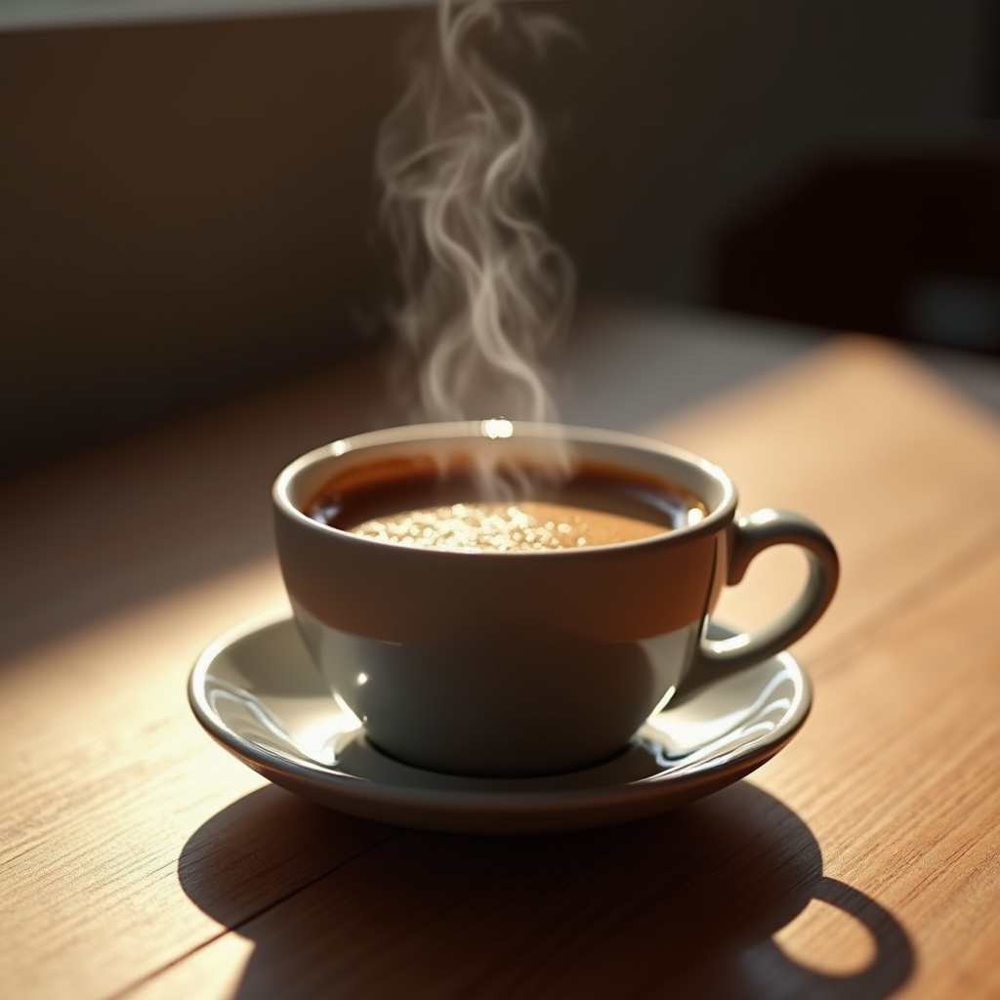

Thinking: <think>
The model should generate an image of a cup of coffee placed on a table, with the coffee appearing warm and inviting, and the table surface visible.
Here’s the expanded prompt: A steaming cup of coffee sits on a wooden table, the rich, dark liquid inside the ceramic cup glowing warmly under soft, natural lighting. The table surface is smooth and slightly textured, with subtle reflections from the cup and ambient light. The scene feels cozy and inviting, with a focus on the cup and table, captured in ultra-realistic detail with a shallow depth of field for a gentle bokeh effect in the background.
</think>


In [76]:
prompt = 'A cup of coffee on a table'
print(prompt)
print('-' * 10)
output_dict = inferencer(text=prompt, **t2i_think_params)
display(output_dict['image'])
print(f"Thinking: {output_dict['text']}")
coffee_img = output_dict['image']

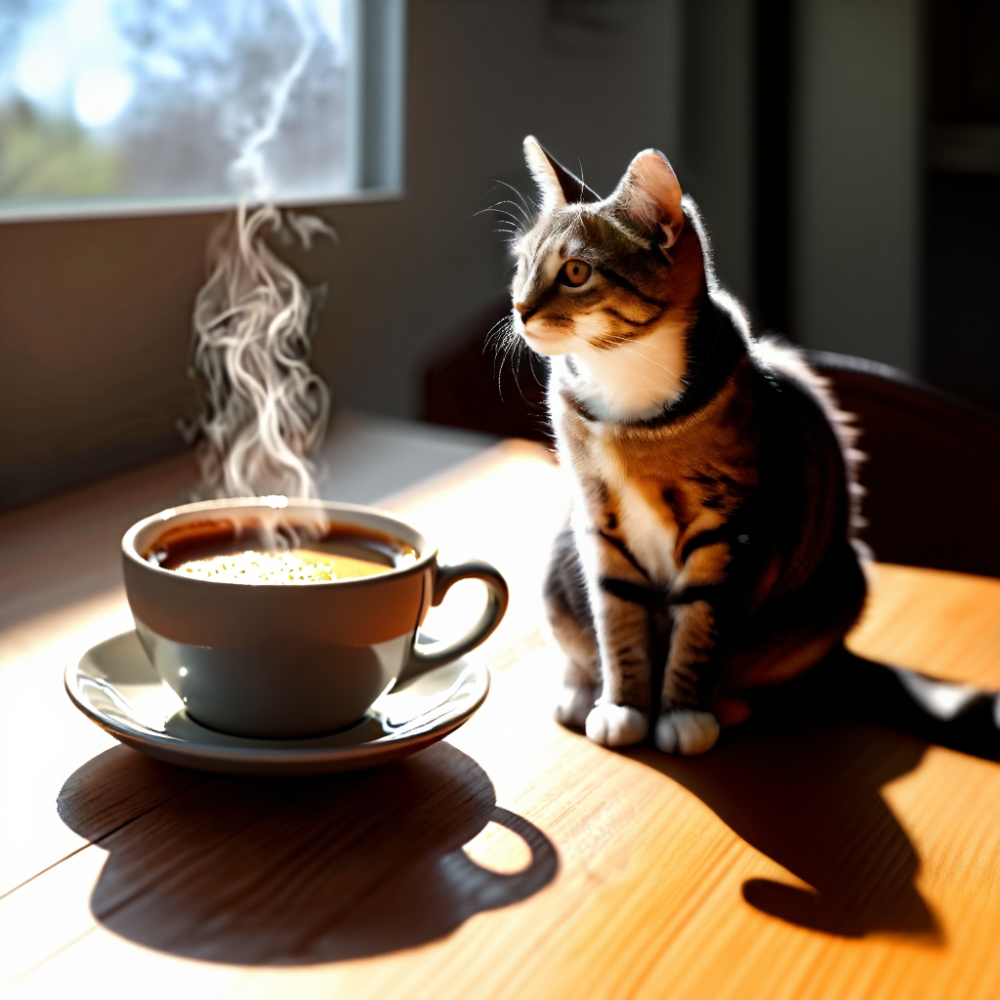

Thinking: <think>
The user wants to add a cat sitting in front of the coffee cup while keeping the original image's structure and layout intact. The coffee cup and lighting should remain unchanged, but a cat should be added to the foreground, ensuring it blends naturally with the scene. The background and table should stay consistent.
</think>


In [77]:
edit_output_dict = inferencer(
    image=coffee_img, 
    text="A cat sits in front of the coffee", 
    **edit_think_params
)
display(edit_output_dict['image'])
print(f"Thinking: {edit_output_dict['text']}")
add_cat_img = edit_output_dict['image']

An orange cat sitting on a table
----------


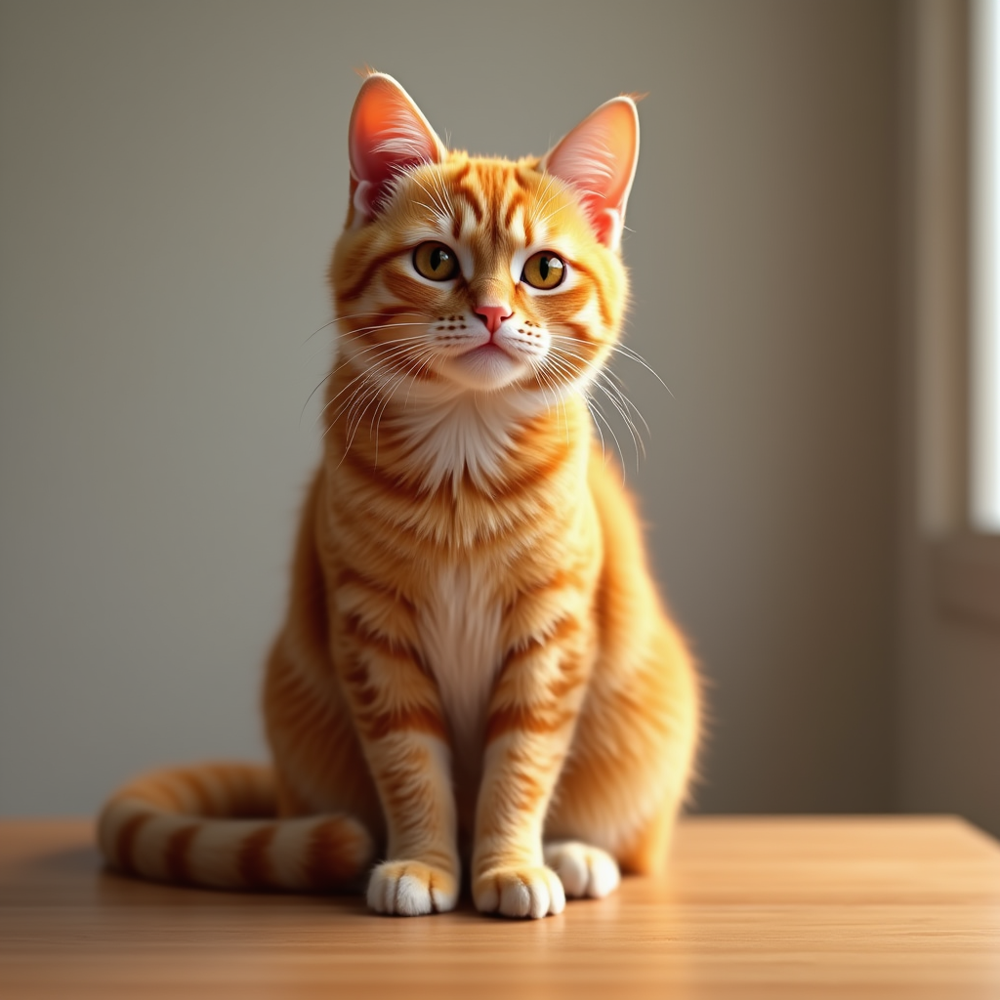

Thinking: <think>
The model should generate an image of an orange cat sitting calmly on a table, with its posture and fur color accurately representing a domestic cat.
Here’s the expanded prompt: A domestic orange cat sitting calmly on a wooden table, its fur vividly detailed with warm, rich tones of orange and subtle shading to emphasize texture and realism. The cat's posture is relaxed, with its body slightly turned to the side, showcasing its graceful form. The table is simple and uncluttered, with a natural wood finish that complements the cat's vibrant fur. The lighting is soft and natural, creating a warm and inviting atmosphere, with gentle shadows adding depth to the scene. The background is softly blurred, featuring a neutral, minimalistic setting to keep the focus entirely on the cat. Ultra-realistic rendering with fine details and lifelike textures.
</think>


In [78]:
prompt = 'An orange cat sitting on a table'
print(prompt)
print('-' * 10)
output_dict = inferencer(text=prompt, **t2i_think_params)
display(output_dict['image'])
print(f"Thinking: {output_dict['text']}")
cat_img = output_dict['image']

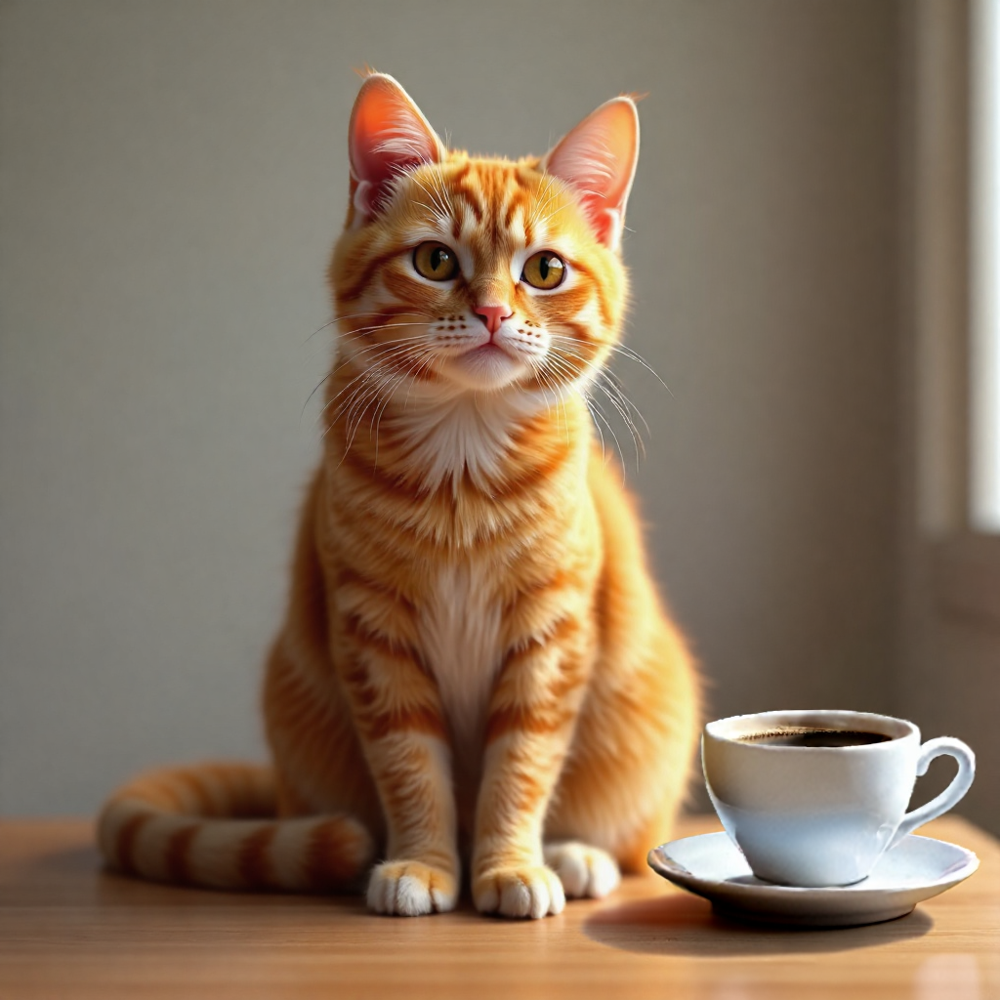

Thinking: <think>
The user wants a cup of coffee added behind the cat while keeping the original image structure and layout intact. The cat and its position should remain unchanged, and the cup of coffee should be placed subtly in the background, ensuring it doesn't obstruct the cat or the table. The lighting and shadows should be adjusted to naturally integrate the cup into the scene.
</think>


In [79]:
edit_output_dict = inferencer(
    image=cat_img, 
    text="Put a cup of coffee behind the cat", 
    **edit_think_params
)
display(edit_output_dict['image'])
print(f"Thinking: {edit_output_dict['text']}")
add_coffee_img = edit_output_dict['image']

A blank highway speed limit sign
----------


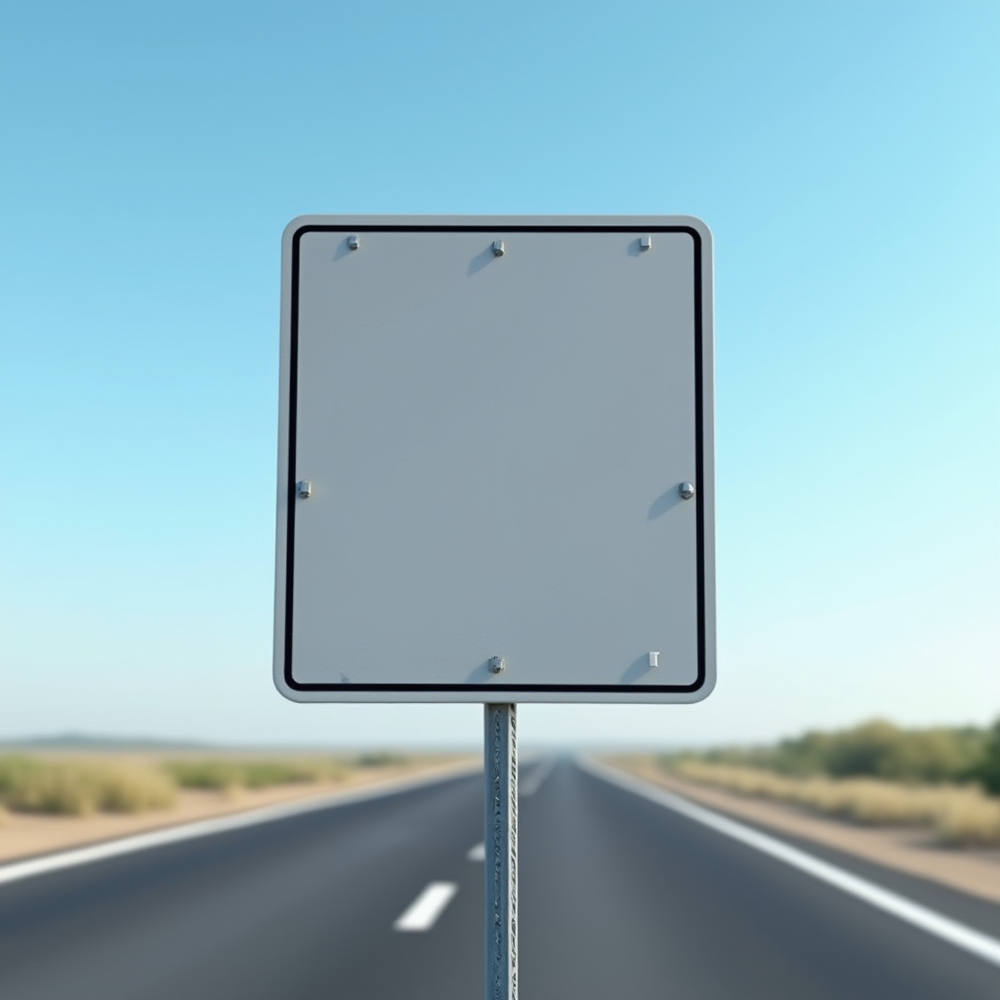

Thinking: <think>
The model should generate an image of a blank, rectangular highway speed limit sign with no text or numbers, placed on a typical road setting.
Here’s the expanded prompt: A blank, rectangular highway speed limit sign with no text or numbers, placed on a typical road setting. The sign is made of durable metal with a slightly reflective surface, featuring a clean, minimalist design. The surrounding environment includes a smooth asphalt road, a faintly visible lane divider, and a distant horizon under a clear blue sky. The lighting is natural and bright, suggesting daytime with soft shadows cast by the sign. The scene is ultra-realistic, with fine details such as subtle textures on the road and the sign’s edges, creating a crisp and lifelike atmosphere.
</think>


In [10]:
prompt = 'A blank highway speed limit sign'
print(prompt)
print('-' * 10)
output_dict = inferencer(text=prompt, **t2i_think_params)
display(output_dict['image'])
print(f"Thinking: {output_dict['text']}")
speed_img = output_dict['image']

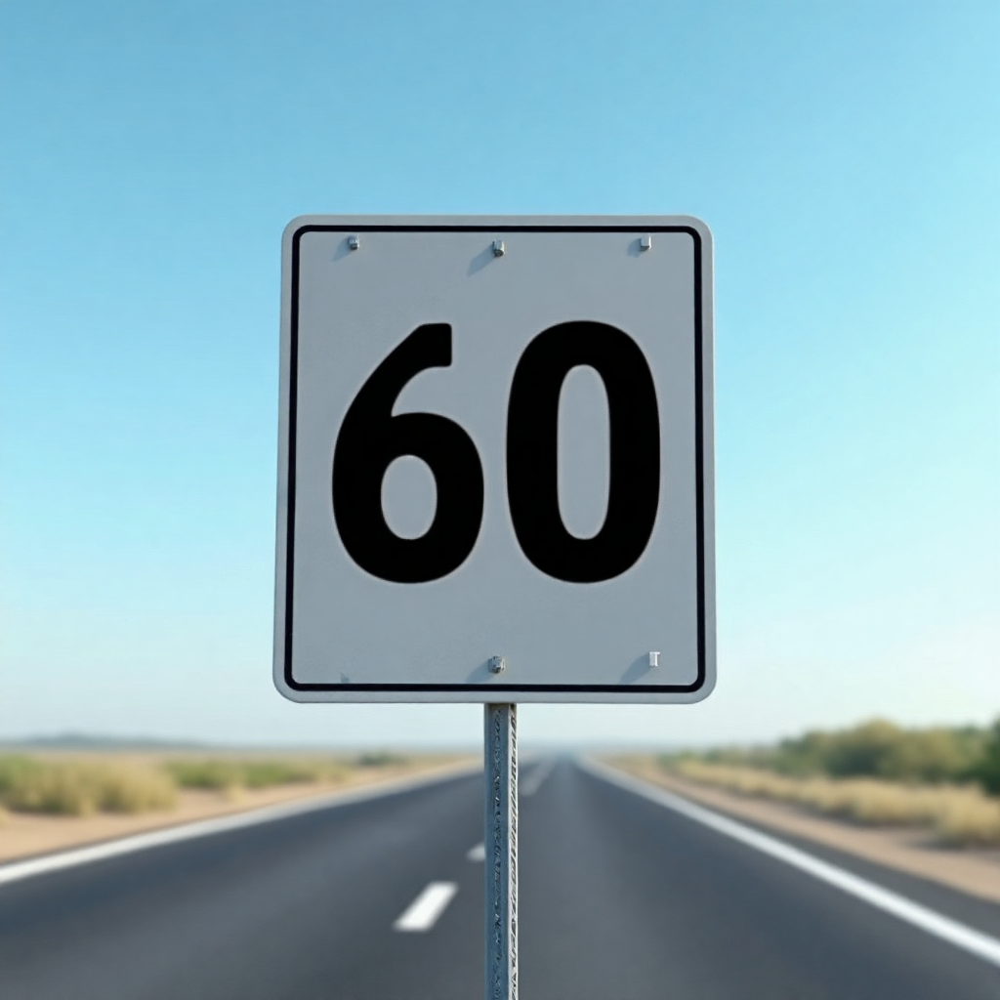

Thinking: <think>
The user wants the blank sign to display the number "60" prominently. The structure and layout of the sign, including its position and the background, should remain unchanged. The answer image should replace the blank space with the number "60" in a clear, bold font, ensuring it is easily readable against the sign's background.
</think>


In [11]:
edit_output_dict = inferencer(
    image=speed_img, 
    text="Add a big \"60\" to the sign", 
    **edit_think_params
)
display(edit_output_dict['image'])
print(f"Thinking: {edit_output_dict['text']}")
number_speed_img = edit_output_dict['image']

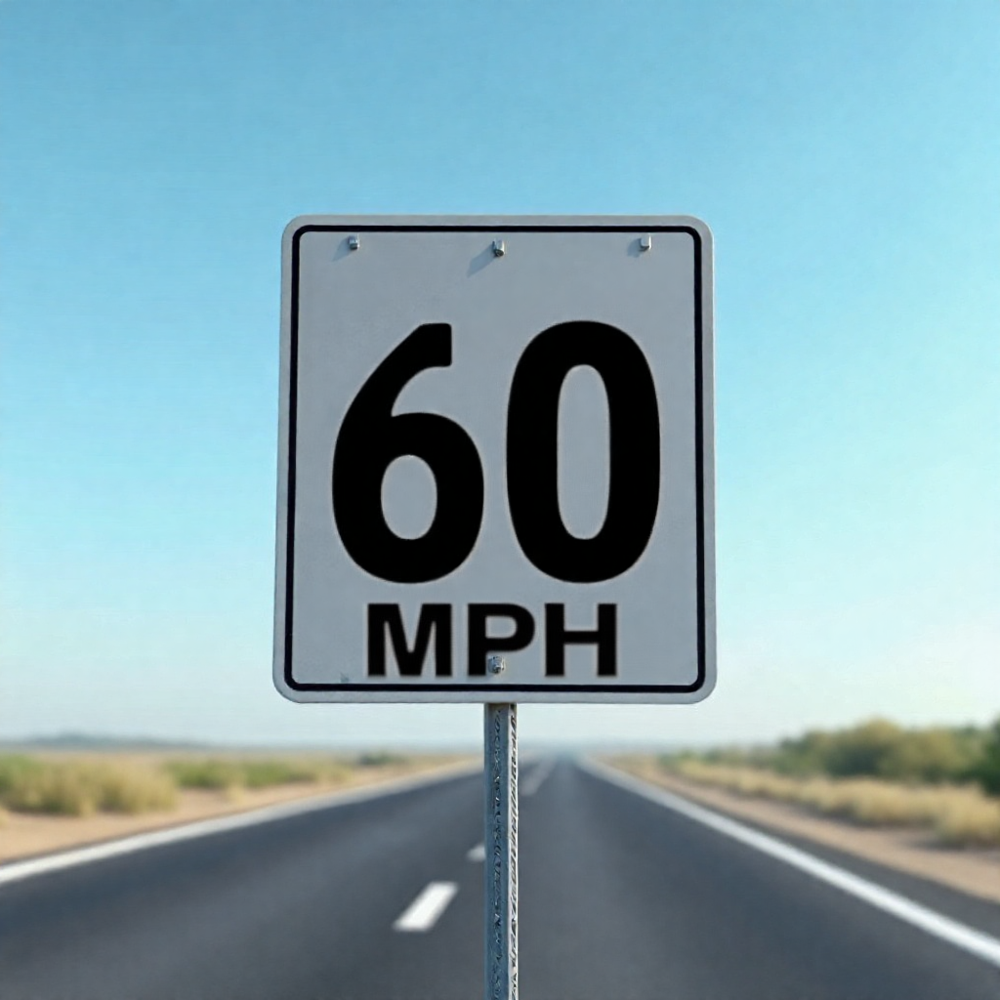

Thinking: <think>
The user wants the number "60" on the sign to be replaced with "60 MPH" while keeping the rest of the image unchanged. The structure, layout, and background of the sign and road should remain the same. Only the text needs to be updated to include "MPH" below the number.
</think>


In [13]:
edit_output_dict = inferencer(
    image=number_speed_img, 
    text="Add the text: \"MPH\" to the sign", 
    **edit_think_params
)
display(edit_output_dict['image'])
print(f"Thinking: {edit_output_dict['text']}")
mph_img = edit_output_dict['image']

An apple and orange both cut in half
----------


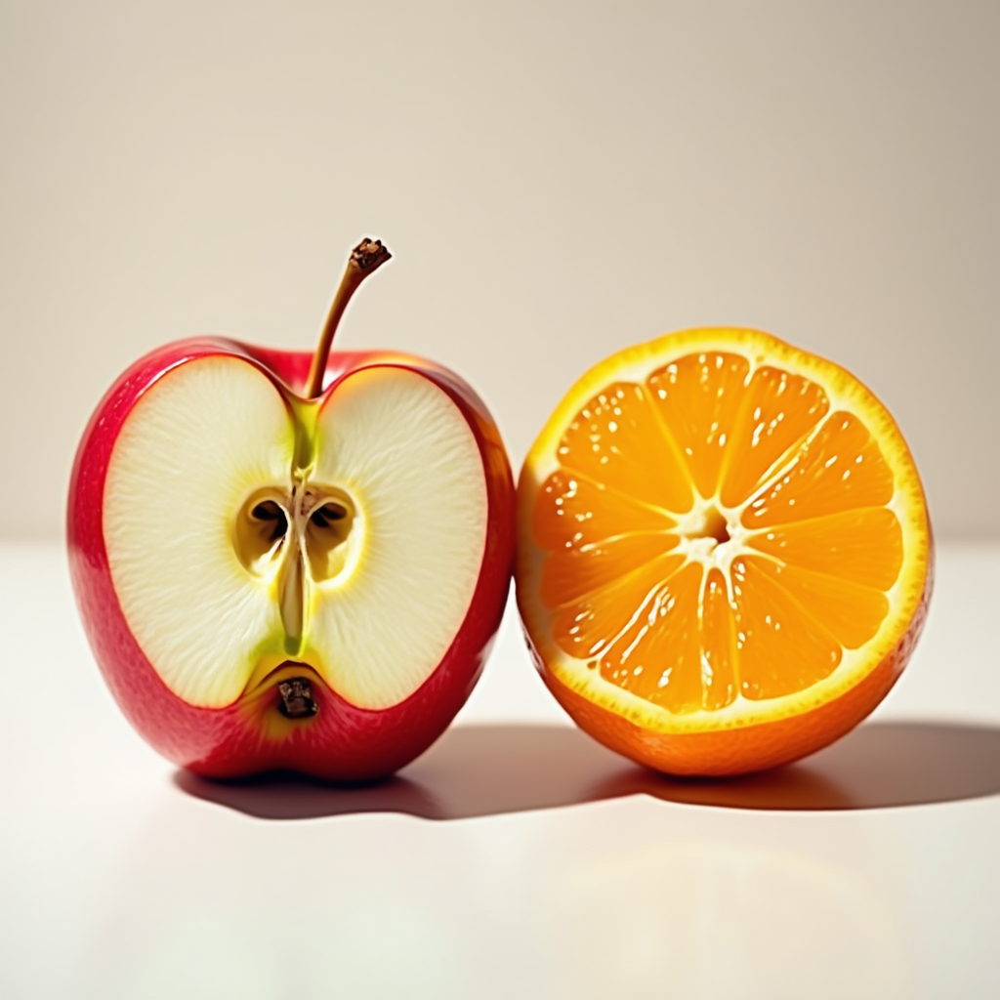

Thinking: <think>
The model should generate an image showing an apple and an orange, each cut in half to reveal their internal structure, including seeds and juice-filled sections.
Here’s the expanded prompt: A hyper-realistic image of a fresh apple and an orange, each cut in half to reveal their internal structure, showcasing the seeds and juicy sections inside. The apple is vibrant red with a smooth, glossy skin, while the orange is bright orange with a textured peel. The halves are arranged side by side on a clean, neutral surface, with soft, natural lighting creating subtle shadows and highlights. The composition is crisp and detailed, emphasizing the textures and colors of the fruit, with a focus on realism and clarity.
</think>


In [72]:
prompt = "An apple and orange both cut in half"
print(prompt)
print('-' * 10)
output_dict = inferencer(text=prompt, **t2i_think_params)
display(output_dict['image'])
print(f"Thinking: {output_dict['text']}")
first_fruits_img = output_dict['image']

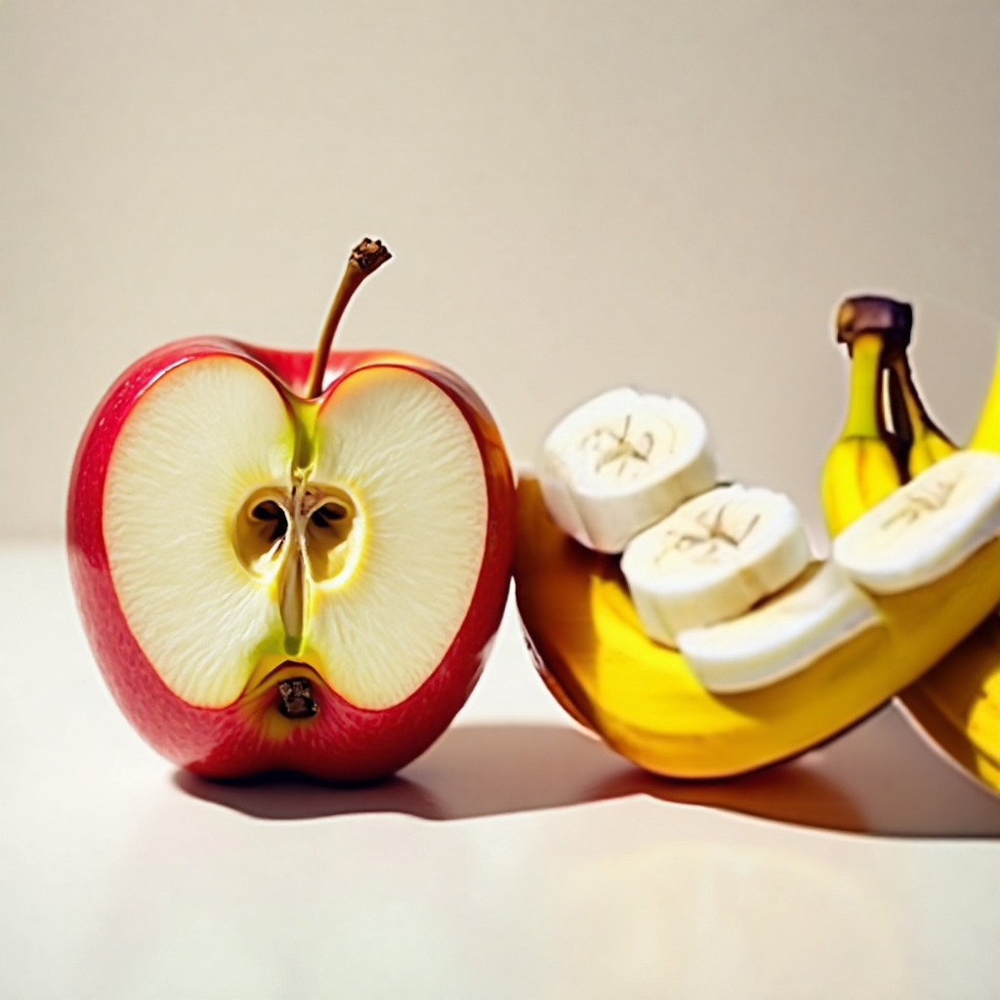

Thinking: <think>
The user wants to add a banana to the image while keeping the apple and orange intact. The layout and positioning of the apple and orange should remain unchanged. The banana should be sliced in half and placed to the right of the orange, ensuring it aligns with the existing composition for balance and visual harmony.
</think>


In [88]:
edit_output_dict = inferencer(
    image=first_fruits_img, 
    text="Add a banana sliced in half", 
    **edit_think_params
)
display(edit_output_dict['image'])
print(f"Thinking: {edit_output_dict['text']}")
second_fruits_img = edit_output_dict['image']

A fruit basket with 2 peaches
----------


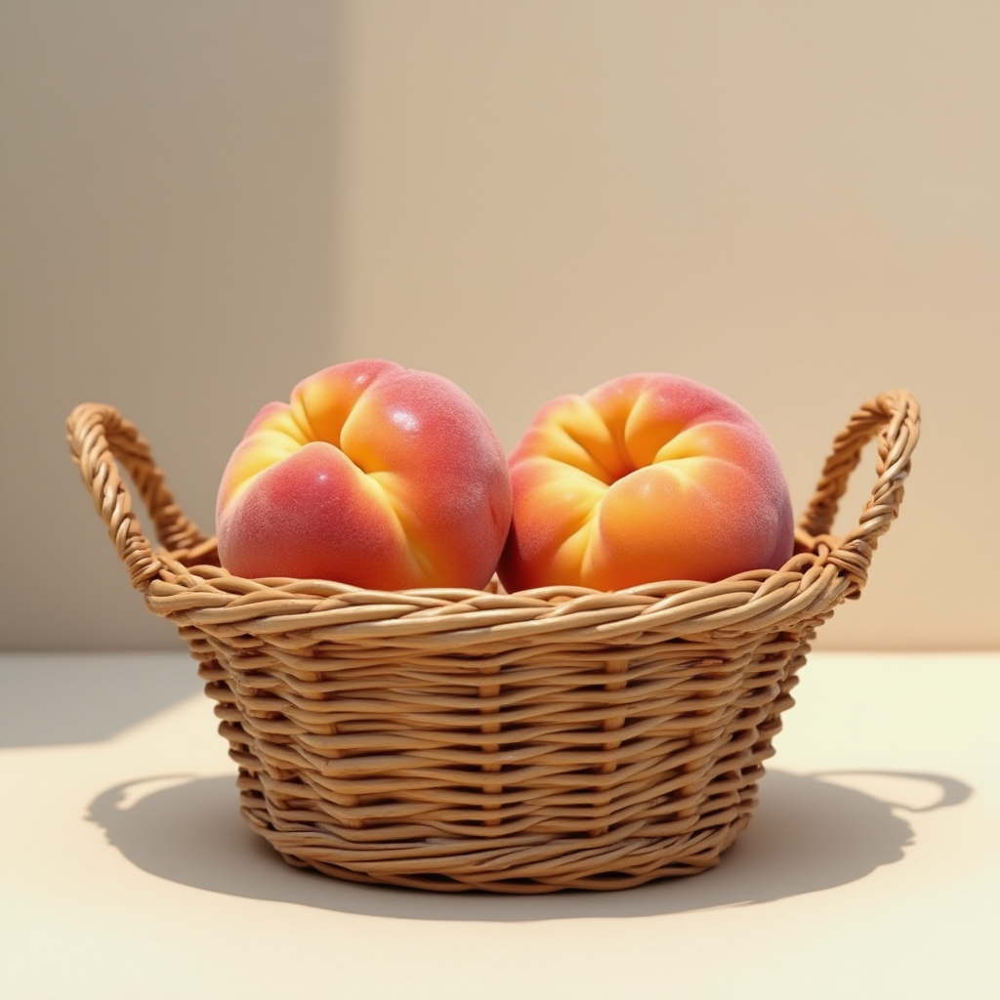

Thinking: <think>
The model should generate an image of a fruit basket containing exactly two peaches, ensuring the count is accurate and visually clear.
Here’s the expanded prompt: A beautifully arranged fruit basket containing exactly two ripe peaches, placed on a clean, neutral surface. The peaches are vibrant in color, with a soft gradient of warm orange and pink hues, and their fuzzy texture is clearly visible. The basket is woven from natural materials, such as wicker or rattan, with a rustic yet elegant design. The lighting is soft and natural, creating gentle shadows and a warm, inviting atmosphere. The image is ultra-realistic, with fine details in the peaches' skin, the basket's weave, and the subtle reflections on the surface beneath.
</think>


In [86]:
prompt = "A fruit basket with 2 peaches"
print(prompt)
print('-' * 10)
output_dict = inferencer(text=prompt, **t2i_think_params)
display(output_dict['image'])
print(f"Thinking: {output_dict['text']}")
peaches_2_img = output_dict['image']

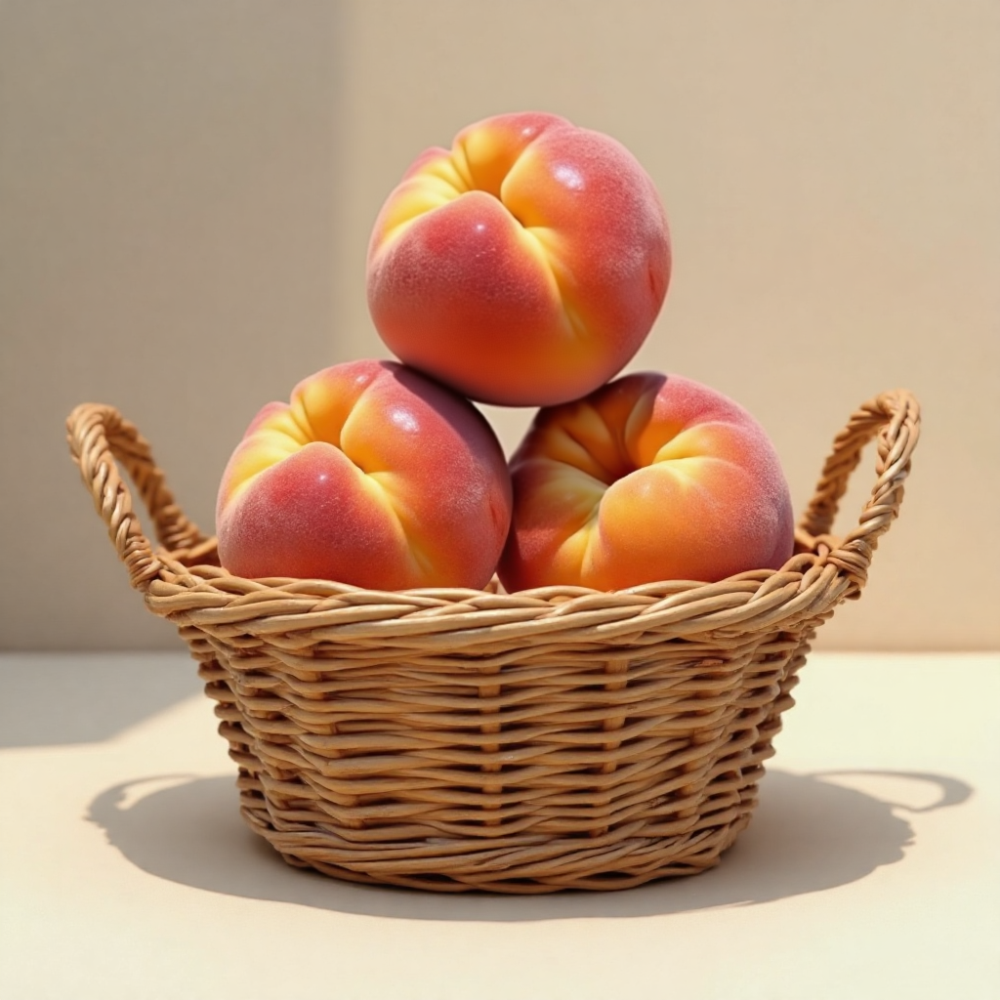

Thinking: <think>
The user wants to add a third peach to the basket while keeping the existing arrangement intact. The basket, lighting, and peach colors should remain unchanged. The new peach should be placed on top of the existing peaches, ensuring it fits naturally within the composition.
</think>


In [93]:
edit_output_dict = inferencer(
    image=peaches_2_img, 
    text="Add another peach to the basket on top of the other peaches", 
    **edit_think_params
)
display(edit_output_dict['image'])
print(f"Thinking: {edit_output_dict['text']}")
peaches_3_img = edit_output_dict['image']

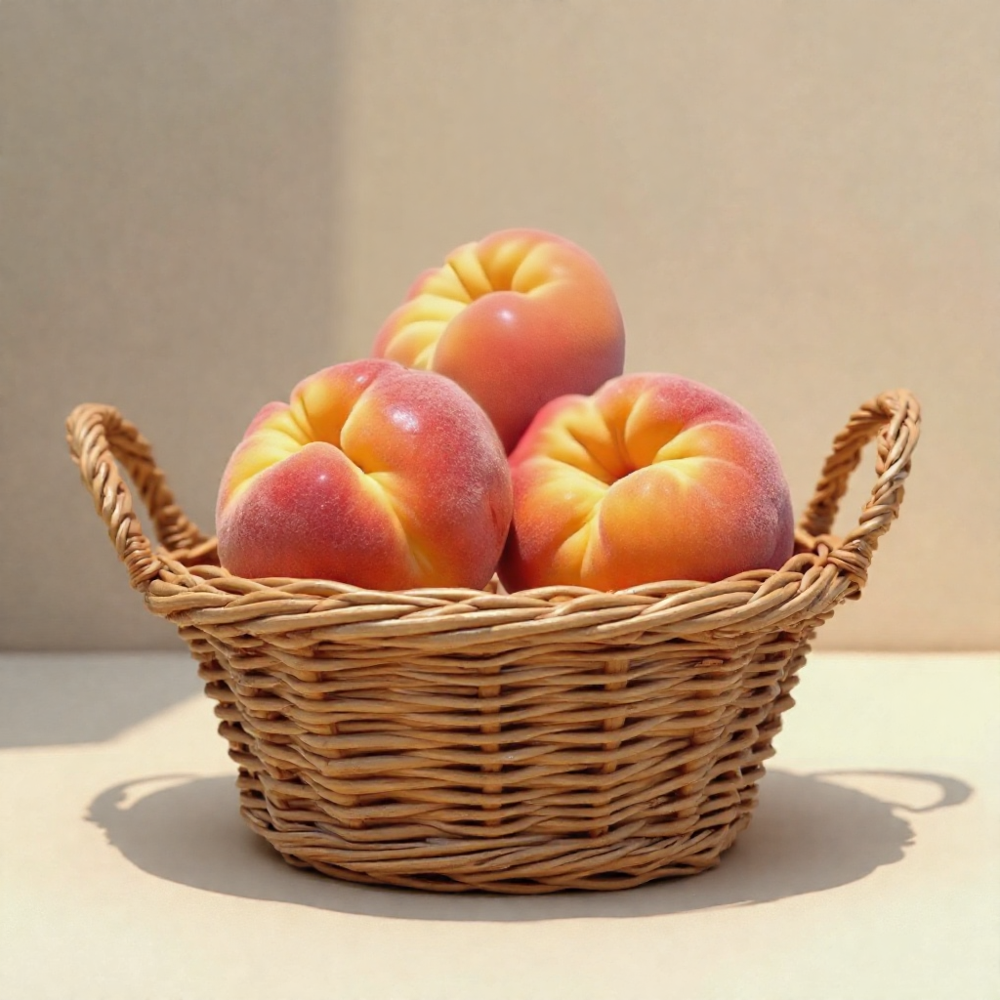

Thinking: <think>
The user wants to add one more peach to the basket while keeping the overall structure and layout the same. The basket and lighting should remain unchanged, and the new peach should be placed naturally among the existing ones, ensuring it blends seamlessly with the existing arrangement.
</think>


In [92]:
edit_output_dict = inferencer(
    image=peaches_3_img, 
    text="Add another peach to the basket", 
    **edit_think_params
)
display(edit_output_dict['image'])
print(f"Thinking: {edit_output_dict['text']}")
final_peaches = edit_output_dict['image']